Image Processing dengan Python
Notebook untuk demonstrasi berbagai teknik pengolahan citra


In [2]:
# ==========================================
# 1. IMPORT MODULE
# ==========================================
import numpy as np
import pandas as pd
import cv2 as cv
from skimage import io
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Konfigurasi matplotlib
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 12

In [3]:
# ==========================================
# 2. FUNGSI HELPER
# ==========================================

def cv_imshow(img, title="Image", figsize=(15, 10)):
    """Menampilkan gambar dengan matplotlib"""
    plt.figure(figsize=figsize)
    if len(img.shape) == 2:  # Grayscale
        plt.imshow(img, cmap='gray')
    else:  # Color
        plt.imshow(img)
    plt.title(title, fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()


def display_multiple_images(images, titles, figsize=(20, 10), cmap=None):
    """Menampilkan beberapa gambar dalam satu figure"""
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]

    for ax, img, title in zip(axes, images, titles):
        if len(img.shape) == 2:
            ax.imshow(img, cmap='gray' if cmap is None else cmap)
        else:
            ax.imshow(img)
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.axis('off')

    plt.tight_layout()
    plt.show()


def histeq(im, nbr_bins=256):
    """Histogram equalization untuk gambar grayscale"""
    imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
    cdf = imhist.cumsum()
    cdf = imhist.max() * cdf / cdf.max()
    cdf_mask = np.ma.masked_equal(cdf, 0)
    cdf_mask = (cdf_mask - cdf_mask.min()) * 255 / (cdf_mask.max() - cdf_mask.min())
    cdf = np.ma.filled(cdf_mask, 0).astype('uint8')
    return cdf[im.astype('uint8')]


def plot_histogram(image, title="Histogram", color='blue'):
    """Plot histogram untuk gambar"""
    plt.figure(figsize=(12, 6))

    if len(image.shape) == 2:  # Grayscale
        plt.hist(image.ravel(), bins=256, range=[0, 256], color=color, alpha=0.7)
        plt.xlabel('Intensitas Piksel')
        plt.ylabel('Frekuensi')
        plt.title(title)
        plt.grid(alpha=0.3)
    else:  # Color image
        colors = ('b', 'g', 'r')
        labels = ('Blue', 'Green', 'Red')
        for i, (col, label) in enumerate(zip(colors, labels)):
            histr = cv.calcHist([image], [i], None, [256], [0, 256])
            plt.plot(histr, color=col, label=label, linewidth=2)
        plt.xlabel('Intensitas Piksel')
        plt.ylabel('Frekuensi')
        plt.title(title)
        plt.legend()
        plt.xlim([0, 256])
        plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

SECTION 1: Membaca dan Menampilkan Gambar
✓ Gambar berhasil dimuat. Shape: (546, 563, 3)
✓ Tipe data: uint8
✓ Range nilai: [4, 255]


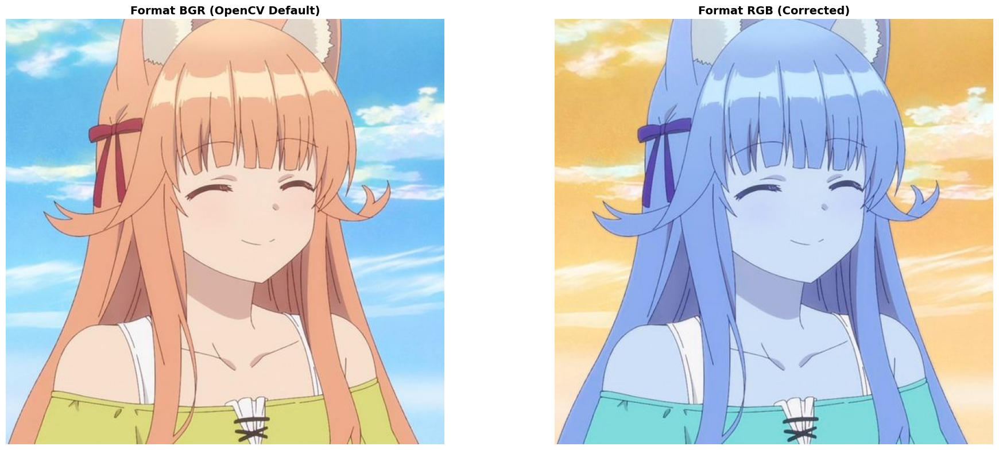

In [4]:
# ==========================================
# 3. BACA GAMBAR DARI URL
# ==========================================

print("=" * 60)
print("SECTION 1: Membaca dan Menampilkan Gambar")
print("=" * 60)

urls = [
    "https://i.pinimg.com/564x/08/48/4c/08484ca4c47429b1dcf6a27ff1c5d0ce.jpg",
    "https://i.pinimg.com/564x/63/51/29/635129c29822e5fdb75fe36041cddb9a.jpg",
    "https://i.pinimg.com/564x/66/61/17/6661178329ba2397217fa01569b95498.jpg"
]

# Membaca gambar pertama untuk demonstrasi
try:
    image = io.imread(urls[0])
    print(f"✓ Gambar berhasil dimuat. Shape: {image.shape}")
    print(f"✓ Tipe data: {image.dtype}")
    print(f"✓ Range nilai: [{image.min()}, {image.max()}]")

    # Konversi BGR ke RGB
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    # Tampilkan perbandingan
    display_multiple_images(
        [image, image_rgb],
        ['Format BGR (OpenCV Default)', 'Format RGB (Corrected)'],
        figsize=(20, 8)
    )
except Exception as e:
    print(f"✗ Error membaca gambar: {e}")


SECTION 2: Konversi Grayscale
✓ Gambar grayscale. Shape: (546, 563)


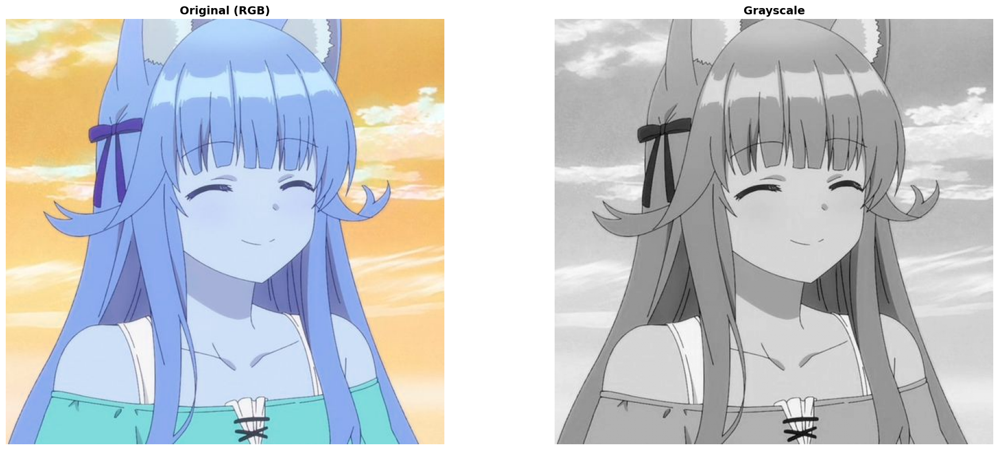

In [5]:
# ==========================================
# 4. KONVERSI GRAYSCALE
# ==========================================

print("\n" + "=" * 60)
print("SECTION 2: Konversi Grayscale")
print("=" * 60)

gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
print(f"✓ Gambar grayscale. Shape: {gray_image.shape}")

display_multiple_images(
    [image_rgb, gray_image],
    ['Original (RGB)', 'Grayscale'],
    figsize=(20, 8)
)


SECTION 3: Analisis Histogram


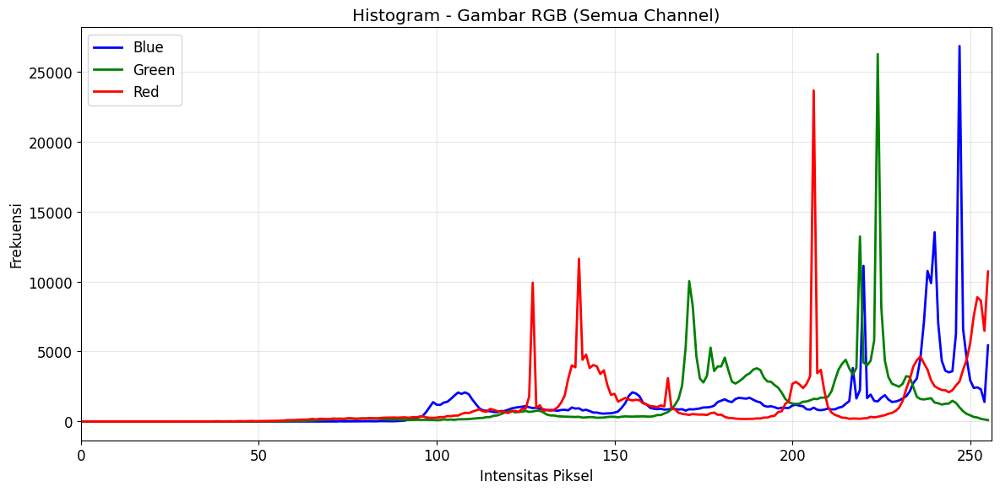

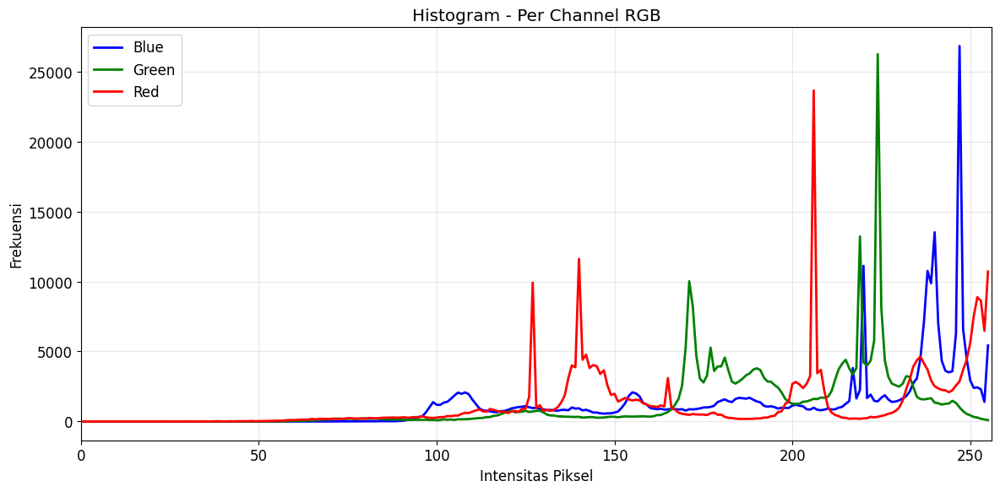

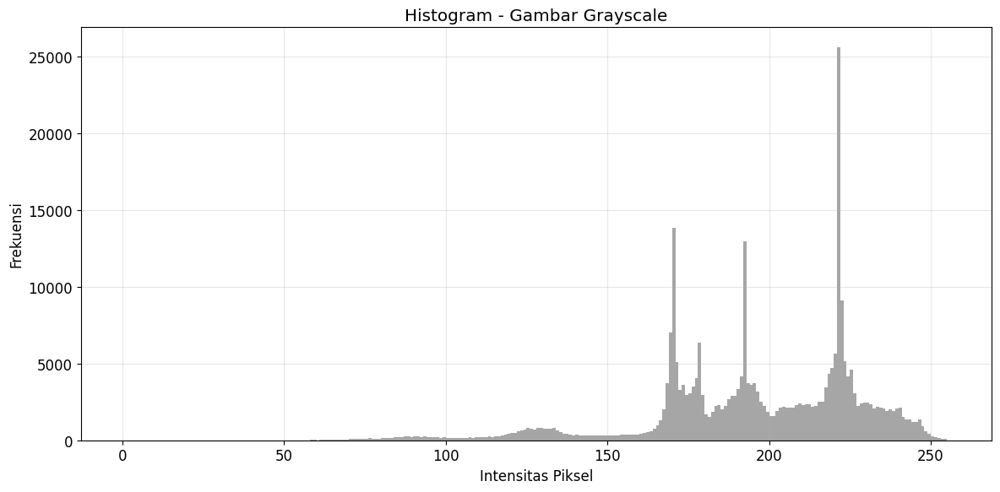

In [6]:
# ==========================================
# 5. HISTOGRAM ANALYSIS
# ==========================================

print("\n" + "=" * 60)
print("SECTION 3: Analisis Histogram")
print("=" * 60)

# Histogram gambar berwarna
plot_histogram(image, "Histogram - Gambar RGB (Semua Channel)")

# Histogram per channel
plot_histogram(image, "Histogram - Per Channel RGB")

# Histogram grayscale
plot_histogram(gray_image, "Histogram - Gambar Grayscale", color='gray')


SECTION 4: Deteksi Kontur


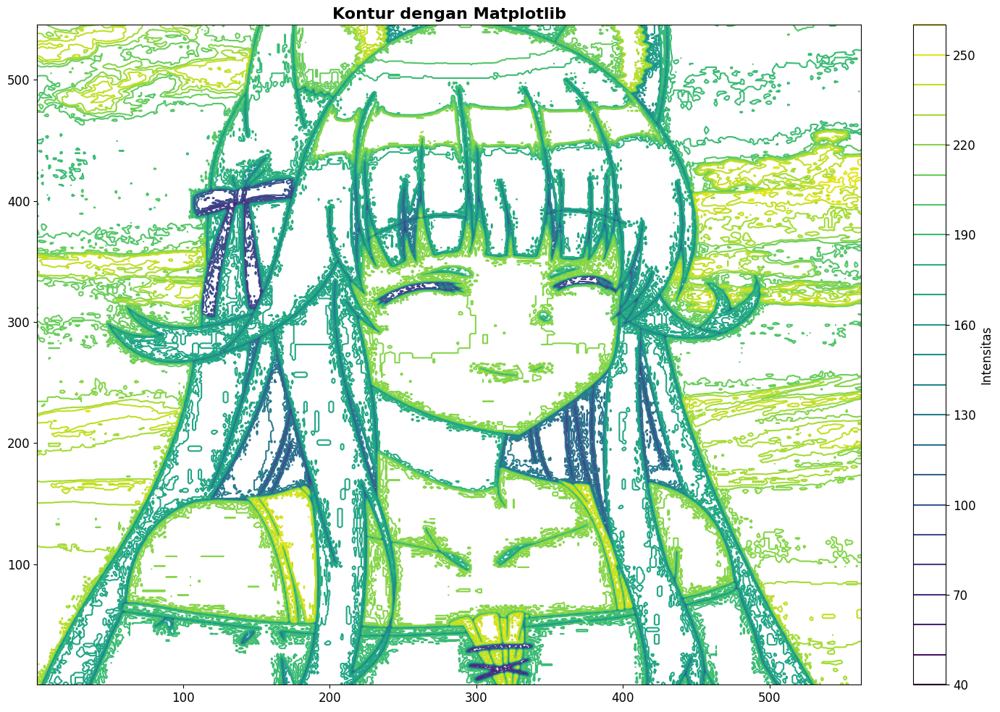

✓ Jumlah kontur ditemukan: 485


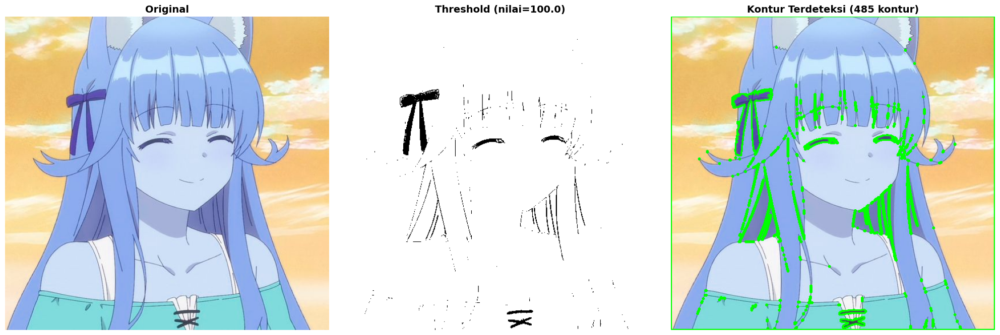

In [7]:
# ==========================================
# 6. DETEKSI KONTUR
# ==========================================

print("\n" + "=" * 60)
print("SECTION 4: Deteksi Kontur")
print("=" * 60)

# Metode 1: Matplotlib contour
plt.figure(figsize=(15, 10))
plt.contour(gray_image, origin="image", levels=20, cmap='viridis')
plt.title('Kontur dengan Matplotlib', fontsize=16, fontweight='bold')
plt.colorbar(label='Intensitas')
plt.tight_layout()
plt.show()

# Metode 2: OpenCV findContours
ret, thresh = cv.threshold(gray_image, 100, 255, cv.THRESH_BINARY)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

image_contours = image_rgb.copy()
cv.drawContours(image_contours, contours, -1, (0, 255, 0), 2)

print(f"✓ Jumlah kontur ditemukan: {len(contours)}")

display_multiple_images(
    [image_rgb, thresh, image_contours],
    ['Original', f'Threshold (nilai={ret:.1f})', f'Kontur Terdeteksi ({len(contours)} kontur)'],
    figsize=(20, 8)
)


SECTION 5: Transformasi Grayscale


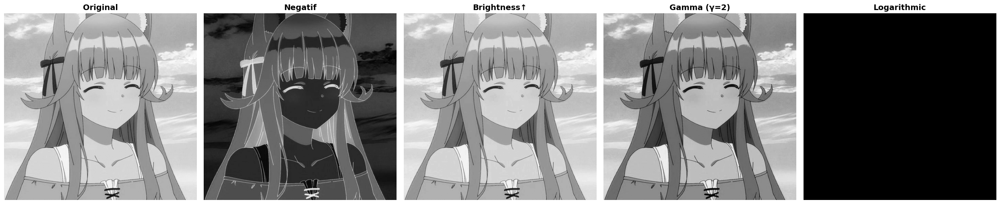

In [8]:
# ==========================================
# 7. TRANSFORMASI GRAYSCALE
# ==========================================

print("\n" + "=" * 60)
print("SECTION 5: Transformasi Grayscale")
print("=" * 60)

# Negatif
im_negative = 255 - gray_image

# Brightness increase
im_bright = np.clip((100.0/255) * gray_image + 100, 0, 255).astype(np.uint8)

# Power law (gamma correction)
im_gamma = np.clip(255.0 * (gray_image / 255.0) ** 2, 0, 255).astype(np.uint8)

# Logarithmic
c = 255 / np.log(1 + np.max(gray_image))
im_log = np.clip(c * np.log(1 + gray_image), 0, 255).astype(np.uint8)

display_multiple_images(
    [gray_image, im_negative, im_bright, im_gamma, im_log],
    ['Original', 'Negatif', 'Brightness↑', 'Gamma (γ=2)', 'Logarithmic'],
    figsize=(25, 5)
)



SECTION 6: Histogram Equalization


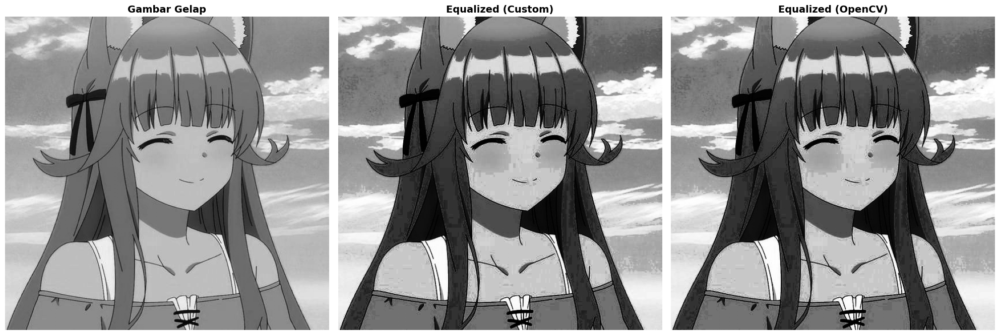

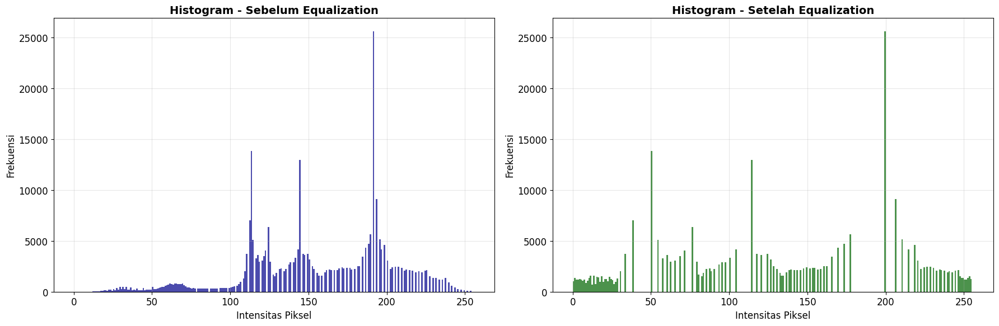

In [9]:
# ==========================================
# 8. HISTOGRAM EQUALIZATION
# ==========================================

print("\n" + "=" * 60)
print("SECTION 6: Histogram Equalization")
print("=" * 60)

# Terapkan pada gambar gelap (gamma)
im_eq = histeq(im_gamma)

# Menggunakan metode OpenCV
im_eq_cv = cv.equalizeHist(im_gamma)

display_multiple_images(
    [im_gamma, im_eq, im_eq_cv],
    ['Gambar Gelap', 'Equalized (Custom)', 'Equalized (OpenCV)'],
    figsize=(20, 8)
)

# Plot histogram sebelum dan sesudah
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].hist(im_gamma.ravel(), bins=256, range=[0, 256], color='darkblue', alpha=0.7)
axes[0].set_title('Histogram - Sebelum Equalization', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Intensitas Piksel')
axes[0].set_ylabel('Frekuensi')
axes[0].grid(alpha=0.3)

axes[1].hist(im_eq.ravel(), bins=256, range=[0, 256], color='darkgreen', alpha=0.7)
axes[1].set_title('Histogram - Setelah Equalization', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Intensitas Piksel')
axes[1].set_ylabel('Frekuensi')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


SECTION 7: Image Filtering


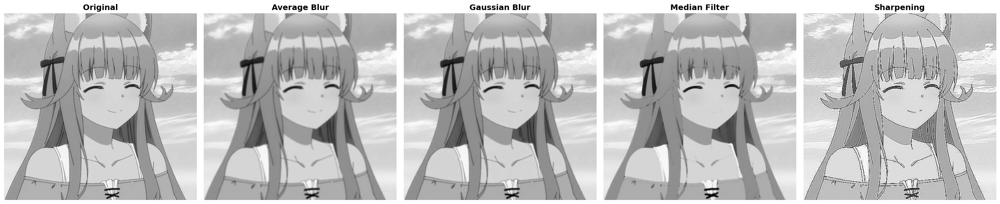

In [10]:
# ==========================================
# 9. FILTERING (SMOOTHING & SHARPENING)
# ==========================================

print("\n" + "=" * 60)
print("SECTION 7: Image Filtering")
print("=" * 60)

# Berbagai filter
im_blur = cv.blur(gray_image, (5, 5))
im_gaussian = cv.GaussianBlur(gray_image, (5, 5), 0)
im_median = cv.medianBlur(gray_image, 5)

# Sharpening kernel
kernel_sharpen = np.array([[-1, -1, -1],
                           [-1,  9, -1],
                           [-1, -1, -1]])
im_sharpen = cv.filter2D(gray_image, -1, kernel_sharpen)

display_multiple_images(
    [gray_image, im_blur, im_gaussian, im_median, im_sharpen],
    ['Original', 'Average Blur', 'Gaussian Blur', 'Median Filter', 'Sharpening'],
    figsize=(25, 5)
)


SECTION 8: Edge Detection


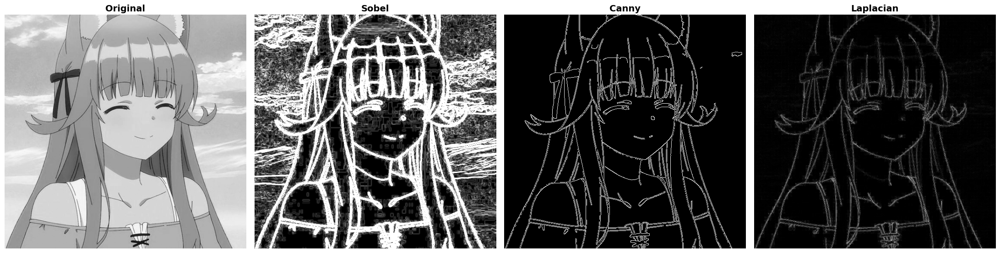

In [11]:
# ==========================================
# 10. EDGE DETECTION
# ==========================================

print("\n" + "=" * 60)
print("SECTION 8: Edge Detection")
print("=" * 60)

# Sobel
sobelx = cv.Sobel(gray_image, cv.CV_64F, 1, 0, ksize=5)
sobely = cv.Sobel(gray_image, cv.CV_64F, 0, 1, ksize=5)
sobel = np.sqrt(sobelx**2 + sobely**2)
sobel = np.clip(sobel, 0, 255).astype(np.uint8)

# Canny
canny = cv.Canny(gray_image, 100, 200)

# Laplacian
laplacian = cv.Laplacian(gray_image, cv.CV_64F)
laplacian = np.clip(np.abs(laplacian), 0, 255).astype(np.uint8)

display_multiple_images(
    [gray_image, sobel, canny, laplacian],
    ['Original', 'Sobel', 'Canny', 'Laplacian'],
    figsize=(22, 6)
)


SECTION 9: Fourier Transform


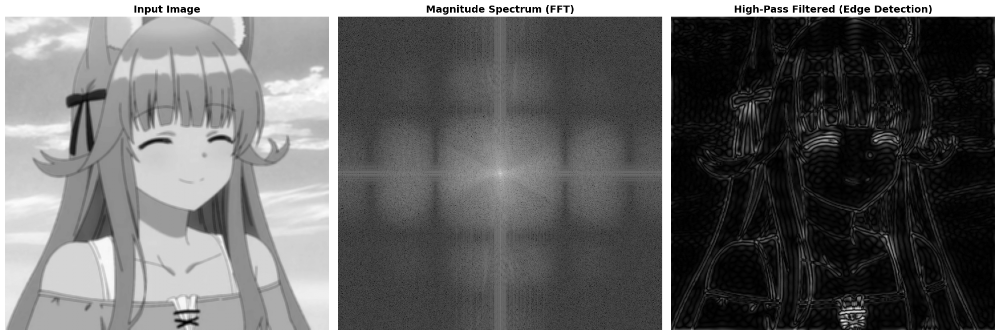

In [12]:
# ==========================================
# 11. TRANSFORMASI FOURIER
# ==========================================

print("\n" + "=" * 60)
print("SECTION 9: Fourier Transform")
print("=" * 60)

imBlur = cv.blur(gray_image, (5, 5))

# FFT
f = np.fft.fft2(imBlur)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

# High-pass filter
rows, cols = imBlur.shape
crow, ccol = rows // 2, cols // 2
mask = np.ones((rows, cols), np.uint8)
r = 30  # radius untuk block
mask[crow-r:crow+r, ccol-r:ccol+r] = 0

fshift_filtered = fshift * mask
f_ishift = np.fft.ifftshift(fshift_filtered)
img_back = np.abs(np.fft.ifft2(f_ishift))

display_multiple_images(
    [imBlur, magnitude_spectrum, img_back],
    ['Input Image', 'Magnitude Spectrum (FFT)', 'High-Pass Filtered (Edge Detection)'],
    figsize=(20, 8)
)


SECTION 10: Morphological Operations


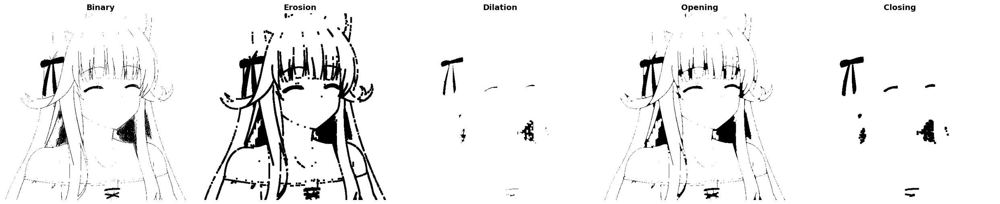


SELESAI! Semua operasi image processing berhasil dijalankan.


In [13]:
# ==========================================
# 12. MORPHOLOGICAL OPERATIONS
# ==========================================

print("\n" + "=" * 60)
print("SECTION 10: Morphological Operations")
print("=" * 60)

# Binary threshold
_, binary = cv.threshold(gray_image, 127, 255, cv.THRESH_BINARY)

kernel = np.ones((5, 5), np.uint8)

# Erosion, Dilation, Opening, Closing
erosion = cv.erode(binary, kernel, iterations=1)
dilation = cv.dilate(binary, kernel, iterations=1)
opening = cv.morphologyEx(binary, cv.MORPH_OPEN, kernel)
closing = cv.morphologyEx(binary, cv.MORPH_CLOSE, kernel)

display_multiple_images(
    [binary, erosion, dilation, opening, closing],
    ['Binary', 'Erosion', 'Dilation', 'Opening', 'Closing'],
    figsize=(25, 5)
)

print("\n" + "=" * 60)
print("SELESAI! Semua operasi image processing berhasil dijalankan.")
print("=" * 60)